# PCA with AUSTEN

DS 5001 Text as Data

**Purpose:**  Implement PCA with the works of Austen.

# Set Up

## Import

In [1]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from scipy.linalg import norm

In [2]:
import plotly_express as px
import seaborn as sns

In [3]:
sns.set(style='ticks')

## Config

In [4]:
import configparser
config = configparser.ConfigParser()
config.read("../../../env.ini")
output_dir = config['DEFAULT']['output_dir']

In [5]:
data_prefix = 'austen-melville'
OHCO = ['book_id', 'chap_id']
colors = "YlGnBu" 

# Prepare the Data

## Import tables

**Downloads**

- [austen-melville-VOCAB2.csv](https://www.dropbox.com/scl/fi/u4t0o5zpoaunyi4l5dklr/austen-melville-VOCAB2.csv?rlkey=5m3fiuucraflg4ntoxqc0t3hv&dl=0)
- [austen-melville-LIB_LABELS.csv](https://www.dropbox.com/scl/fi/f63v0pjqemsody71c9sun/austen-melville-LIB_LABELS.csv?rlkey=0ue1mz9x2ycqybcwti0vsnm9y&dl=0)
- [austen-melville-TFIDF_chap_L2.csv](https://www.dropbox.com/scl/fi/25vtge2qf1b5fed9or1y6/austen-melville-TFIDF_chap_L2.csv?rlkey=fkz9yk0enmlzt3z85ouusgcy2&dl=0)

In [7]:
VOCAB = pd.read_csv(f'{output_dir}/{data_prefix}-VOCAB.csv').set_index('term_str')
LIB = pd.read_csv(f'{output_dir}/{data_prefix}-LIB_LABELS.csv').set_index('book_id')
TFIDF = pd.read_csv(f'{output_dir}/{data_prefix}-TFIDF_chap_L2.csv').set_index(['book_id', 'chap_id'])

## Generate analytical tables

In [8]:
class AUSTEN: pass

In [9]:
AUSTEN.LIB = LIB[LIB.author.str.match('AUSTEN')]
AUSTEN.TFIDF = TFIDF.loc[AUSTEN.LIB.index]

# PCA

In [10]:
n_comps = 5
pc_cols = [f"PC{i}" for i in range(n_comps)]
pca_engine = PCA(n_components=n_comps)

In [11]:
DCM = pd.DataFrame(pca_engine.fit_transform(AUSTEN.TFIDF.fillna(0)), index=AUSTEN.TFIDF.index)
DCM.columns = pc_cols # ['PC{}'.format(i) for i in DCM.columns]
DCM = DCM.join(AUSTEN.LIB, on='book_id')
DCM['doc'] = DCM.apply(lambda x: "{}-{}-{}".format(x.author, x.title, x.name[1]), 1)

In [12]:
LOADINGS = pd.DataFrame(pca_engine.components_.T * np.sqrt(pca_engine.explained_variance_))
LOADINGS.columns = ["PC{}".format(i) for i in LOADINGS.columns]
LOADINGS.index = AUSTEN.TFIDF.columns
LOADINGS.index.name = 'term_str'
LOADINGS = LOADINGS.join(VOCAB)

# Visualize

In [13]:
def vis_pcs(a=0, b=1, label='title', hover_name='doc', symbol=None, size=None):
    return px.scatter(DCM, f"PC{a}", f"PC{b}", 
                    color=label, hover_name=hover_name, 
                     symbol=symbol, size=size,
                     marginal_x='box', height=800)

In [14]:
def vis_loadings(a=0, b=1, hover_name='term_str'):
    return px.scatter(LOADINGS.reset_index(), f"PC{a}", f"PC{b}", 
                      text='term_str', hover_name='term_str',
                      size='dfidf', color='max_pos_group', 
                      marginal_x='box', height=800)

## PC 0 and 1

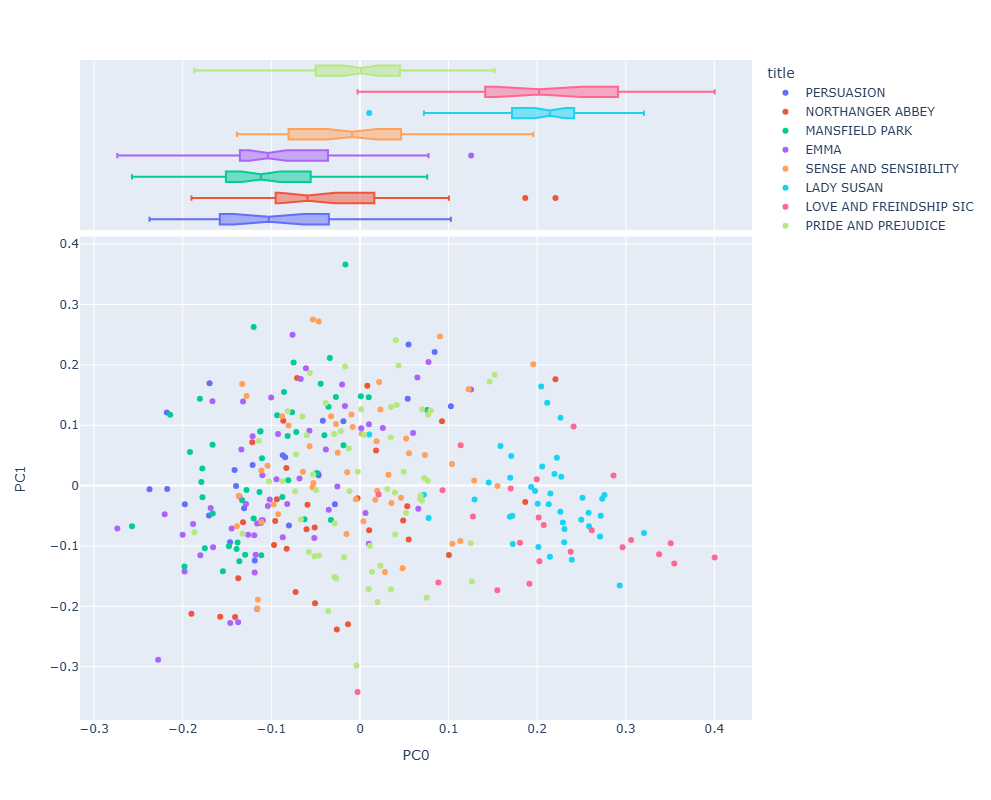

In [15]:
vis_pcs(0, 1)

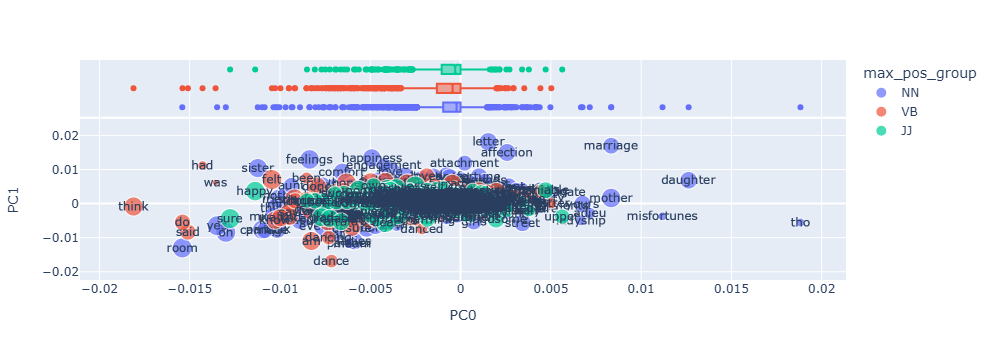

In [16]:
vis_loadings(0, 1)

## PC 1 and 2

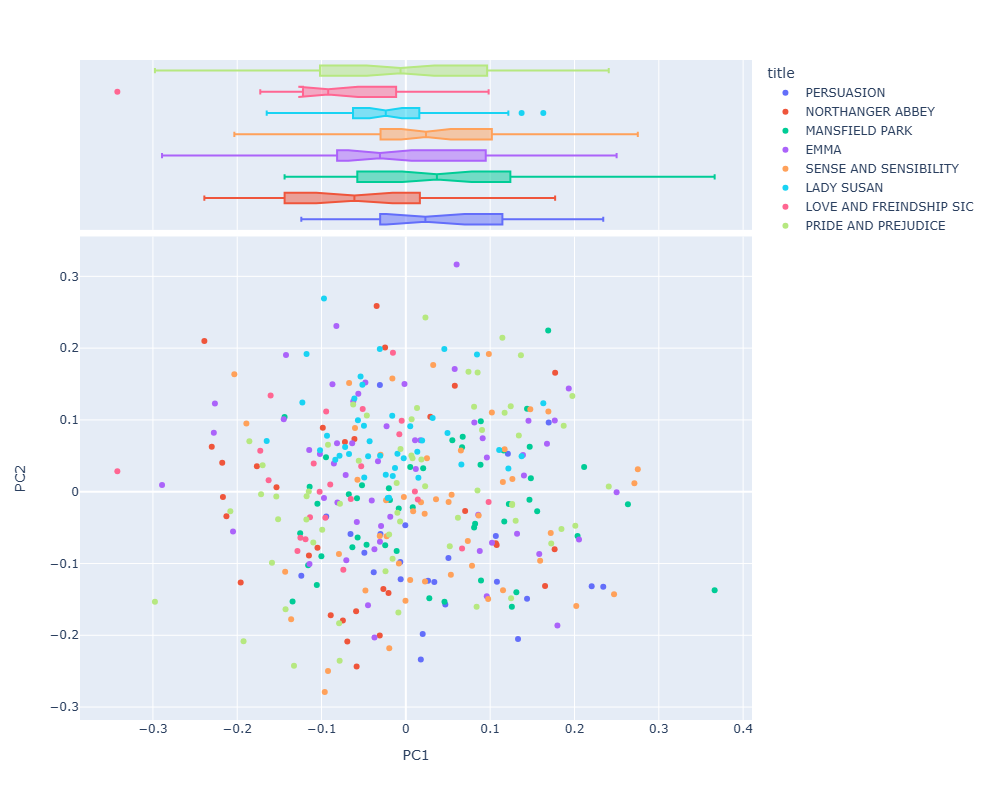

In [16]:
vis_pcs(1, 2)

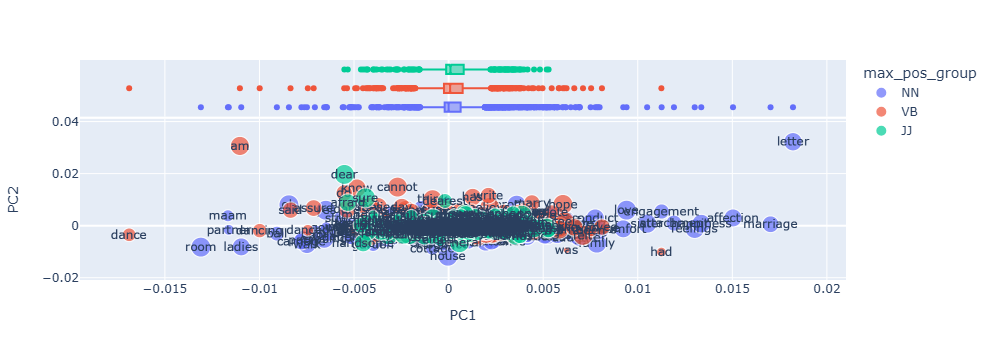

In [17]:
vis_loadings(1, 2)

##  PC 2 and 3

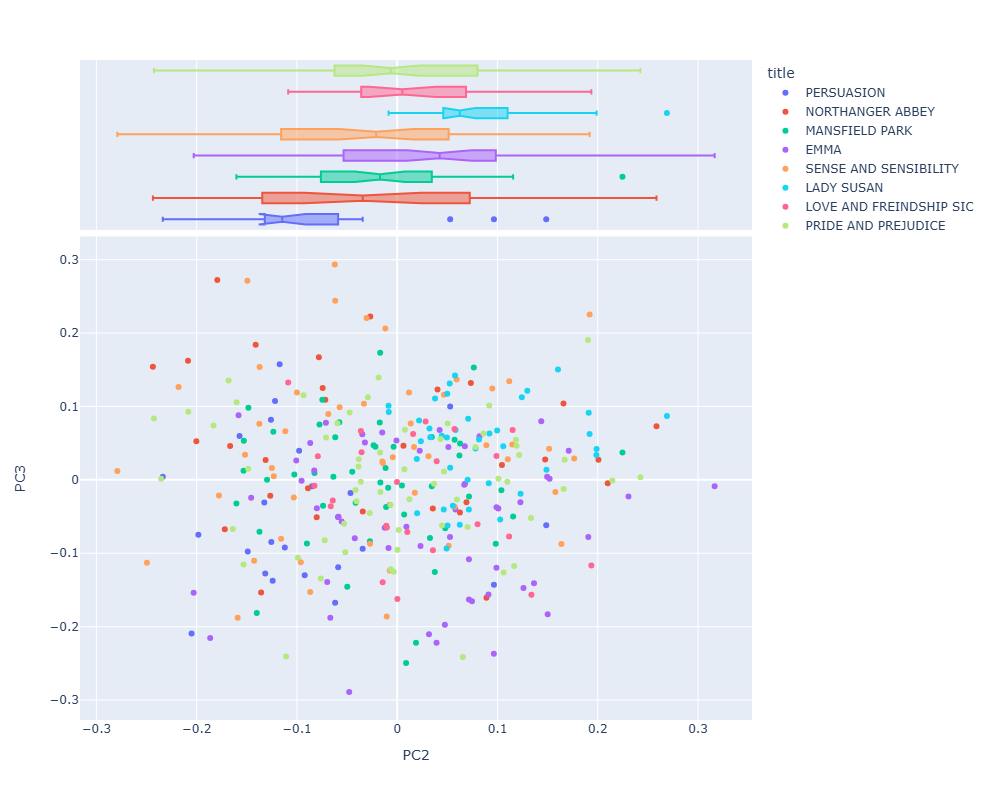

In [18]:
vis_pcs(2, 3)

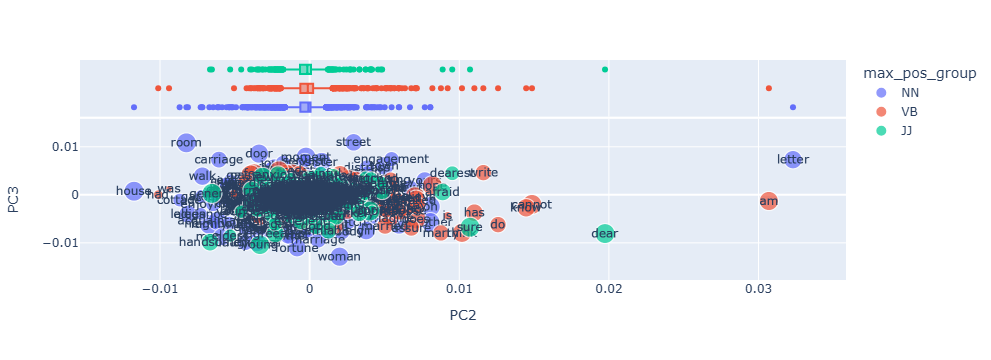

In [19]:
vis_loadings(2, 3)

## Interpet Loadings

In [17]:
top_terms_sk= {}

data = []
for i in range(n_comps):
    for j in [0, 1]:
        data.append((f"PC{i}", j, ' '.join(LOADINGS.sort_values(f'PC{i}', ascending=bool(j)).head(10).index.to_list())))

comp_strs = pd.DataFrame(data)
comp_strs.columns =  ['pc', 'pole', 'top_terms']
comp_strs = comp_strs.set_index(['pc', 'pole'])

In [18]:
COMPS = comp_strs

In [19]:
COMPS

top_terms
pc  pole                                                   
PC0 0     tho daughter misfortunes marriage mother adieu...
    1          think room do said had was yes oh sure happy
PC1 0     letter marriage affection happiness feelings a...
    1     dance room maam partner ladies am dancing ball...
PC2 0     letter am dear cannot know do write has sure t...
    1     house had was cottage room ladies elegance gar...
PC3 0     street room door moment carriage engagement le...
    1     woman fortune young children daughters handsom...
PC4 0     mother sister sisters married dear pounds daug...
    1     feelings ball upper dearest friendship friend ...

In [20]:
COMPS['top_doc'] = pd.concat([DCM[pc_cols].idxmax(), DCM[pc_cols].idxmin()], axis=0, keys=[0,1])\
    .to_frame('top_doc')\
    .reset_index()\
    .rename(columns={'level_0':'pole', 'level_1':'pc'})\
    .set_index(['pc','pole'])\
    .sort_index()

In [24]:
COMPS

top_terms     top_doc
pc  pole                                                               
PC0 0     tho daughter misfortunes mother marriage adieu...   (1212, 3)
    1          think do room said had was yes oh sure happy   (158, 26)
PC1 0     letter marriage affection happiness feelings a...   (141, 48)
    1     dance room maam partner am ladies dancing ball...  (1212, 22)
PC2 0     letter am dear cannot know do write has sure t...    (158, 7)
    1     house had was cottage room ladies elegance gar...    (161, 6)
PC3 0     street room door moment engagement carriage le...   (161, 28)
    1     woman fortune young children daughters handsom...    (158, 4)
PC4 0     mother sister sisters married dear daughters p...  (1342, 49)
    1     feelings ball upper dearest friendship friend ...   (946, 39)

In [23]:
TFIDF.loc[(141, 48)].sort_values(ascending=False).head(20)

term_str
comfort           0.204438
temper            0.161270
happiness         0.161255
punishment        0.156403
had               0.127973
became            0.127790
disappointment    0.119993
disposition       0.106761
domestic          0.099183
regretting        0.095956
been              0.094302
feelings          0.089691
education         0.088579
parent            0.088490
loved             0.087743
guilt             0.087701
sense             0.086724
useful            0.086508
anger             0.079271
vanity            0.079027
Name: (141, 48), dtype: float64

# Cluster Loadings

In [24]:
from sklearn.cluster import KMeans, AgglomerativeClustering
from string import ascii_uppercase as ltrs

In [25]:
k = n_comps * 2
# LOADINGS['cat'] = [ltrs[i] for i in KMeans(k, n_init=10).fit_predict(LOADINGS[pc_cols])]
LOADINGS['cat'] = [ltrs[i] for i in AgglomerativeClustering(k).fit_predict(LOADINGS[pc_cols])]

In [26]:
# LOADINGS['cat'].value_counts()

In [27]:
LOADINGS['maxpc'] = LOADINGS[pc_cols].idxmax(1)
LOADINGS['minpc'] = LOADINGS[pc_cols].idxmin(1)

In [29]:
LOADINGS

,PC0,PC1,PC2,PC3,PC4,term_rank,n,n_chars,p,i,...,idf,tfidf_mean,tfidf_sum,dfidf,dp,di,dh,cat,maxpc,minpc
term_str,,,,,,,,,,,,,,,,,,,,,
home,-0.007577,0.002347,-0.005108,-0.001073,0.000182,227,954,4,0.000463,11.075638,...,1.353780,0.000570,0.639132,594.309346,0.391266,1.353780,0.529687,E,PC1,PC0
cried,-0.007262,-0.002278,0.004217,0.001007,0.003619,179,1232,5,0.000598,10.706696,...,1.337441,0.000896,1.005845,593.823846,0.395722,1.337441,0.529255,H,PC2,PC0
certain,-0.001391,0.001113,0.000953,0.000353,0.002240,291,707,7,0.000343,11.507917,...,1.366985,0.000498,0.558589,594.638636,0.387701,1.366985,0.529981,A,PC4,PC0
looking,-0.006908,-0.003808,-0.001511,-0.000435,-0.000311,242,880,7,0.000427,11.192123,...,1.390390,0.000530,0.594542,595.086909,0.381462,1.390390,0.530380,E,PC4,PC0
general,-0.003484,0.000585,-0.006554,0.000260,-0.000804,256,831,7,0.000404,11.274778,...,1.387023,0.000505,0.566756,595.032920,0.382353,1.387023,0.530332,E,PC1,PC2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
upstairs,-0.001724,-0.000098,0.000226,0.002031,-0.001176,5735,26,8,0.000013,16.273043,...,5.672425,0.000053,0.058923,124.793358,0.019608,5.672425,0.111224,A,PC3,PC0
sunshine,-0.000469,-0.000329,-0.000385,0.000484,-0.000199,5505,28,8,0.000014,16.166128,...,5.809929,0.000062,0.069287,116.198577,0.017825,5.809929,0.103564,B,PC3,PC0
traveler,-0.000000,-0.000000,0.000000,-0.000000,0.000000,5608,27,8,0.000013,16.218595,...,5.546894,0.000100,0.112740,133.125467,0.021390,5.546894,0.118650,B,PC0,PC0


In [32]:
LOADINGS.groupby('maxpc').apply(lambda x: ' '.join(x.index)) #, include_groups=False)

maxpc
PC0    deck dark form story age beauty crew heads var...
PC1    home general manner felt known best short name...
PC2    cried set oh times find true put sure word poo...
PC3    rest passed others high moment sight looked op...
PC4    certain looking people hands new fine next sma...
dtype: object

In [31]:
LOADINGS.groupby('minpc').apply(lambda x: ' '.join(x.index)) #, include_groups=False)

minpc
PC0    home cried certain looking manner felt set oh ...
PC1    keep am stand door black cold ye town top sail...
PC2    general new small house water large family sev...
PC3    people therefore love years dear person young ...
PC4    given doubt feelings common degree dark mine v...
dtype: object

In [33]:
# LOADINGS

In [33]:
def vizpc(a, b):
    return px.scatter(LOADINGS.reset_index(), f'PC{a}', f'PC{b}', 
                      color='cat', 
                      # size='dh',
                      hover_name='term_str', 
                      marginal_x='box', height=800, width=900)

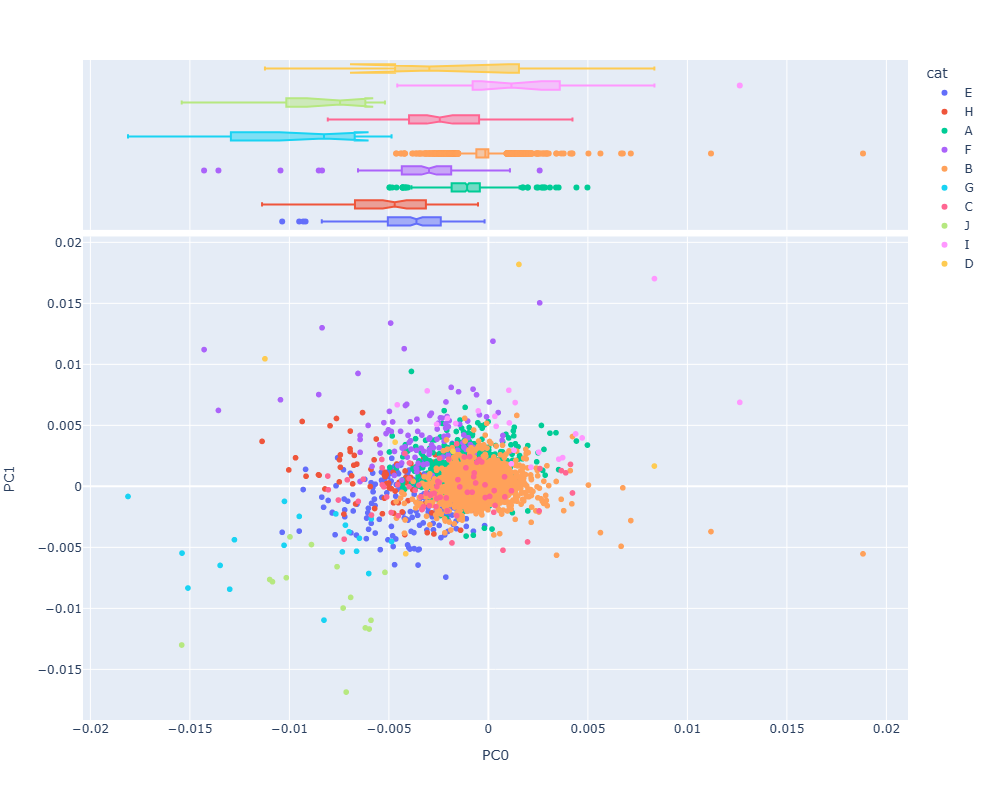

In [34]:
vizpc(0, 1)

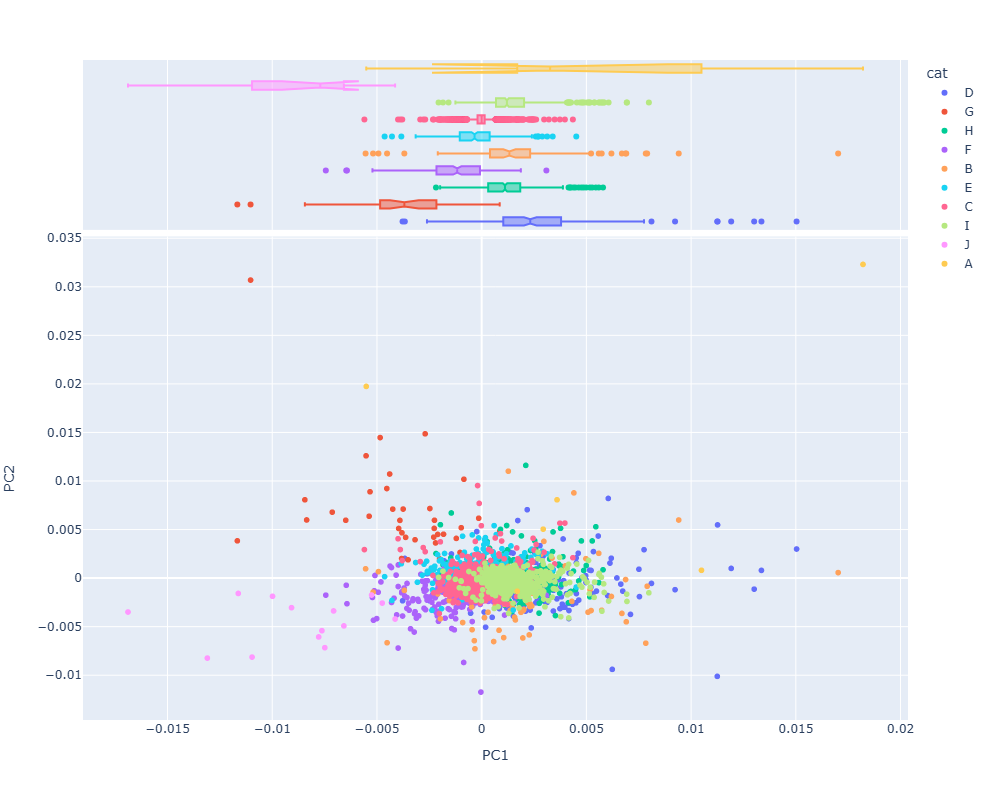

In [36]:
vizpc(1, 2)

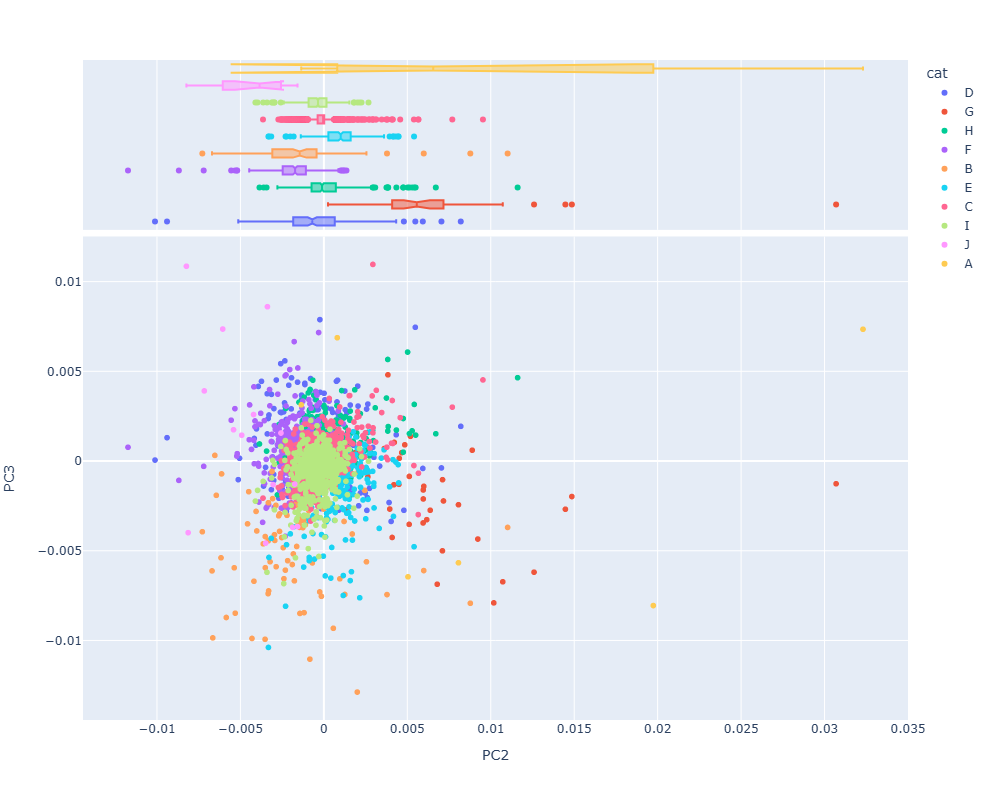

In [37]:
vizpc(2, 3)

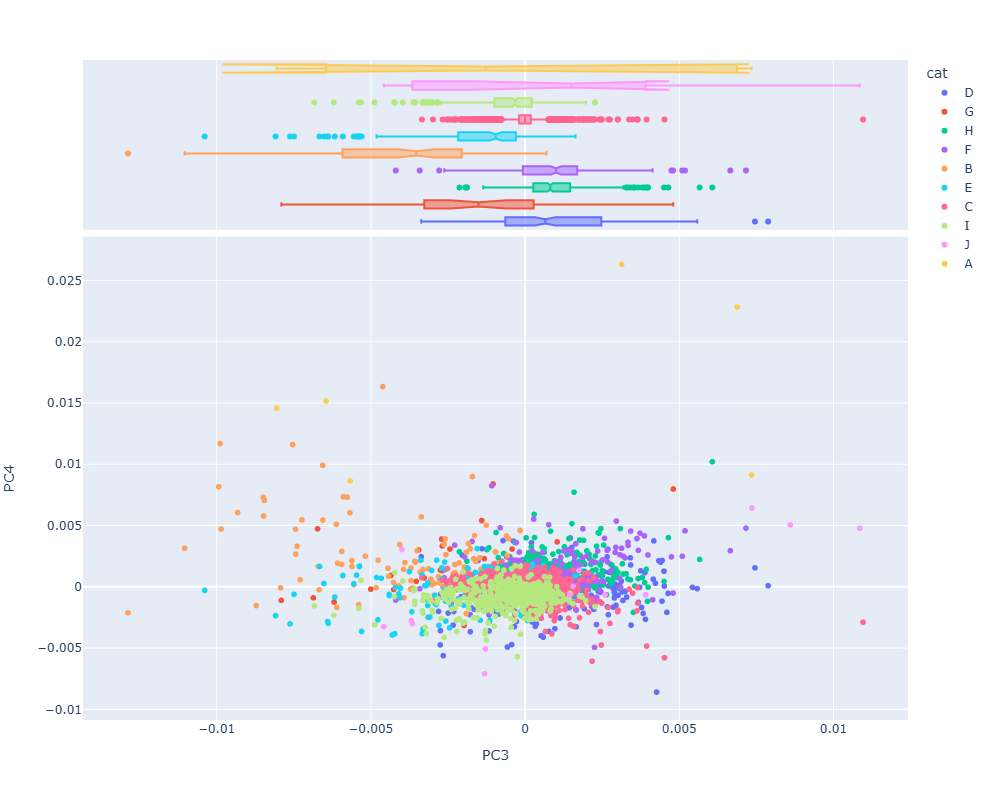

In [38]:
vizpc(3, 4)

# Categories

In [36]:
CATS = LOADINGS.groupby('cat').n.sum().to_frame('n')
CATS['p'] = CATS.n / CATS.n.sum()
CATS['i'] = np.log2(1/CATS.p)
CATS['h'] = CATS.p * CATS.i
CATS['dfidf_mean'] = LOADINGS.groupby('cat').dfidf.mean()
CATS['top_terms'] = LOADINGS.groupby('cat').apply(lambda x: ' '.join(x.sort_values('dfidf', ascending=False).head(10).index)) # , include_groups=False)
CATS['maxpc'] = LOADINGS.groupby('cat')[pc_cols].mean().idxmax(1)
CATS['minpc'] = LOADINGS.groupby('cat')[pc_cols].mean().idxmin(1)

In [37]:
CATS.sort_values('dfidf_mean', ascending=False).style.background_gradient()

,n,p,i,h,dfidf_mean,top_terms,maxpc,minpc
cat,,,,,,,,
D,4708,0.006082,7.361156,0.044773,536.801796,dear mother brother sister letter married,PC4,PC0
G,41791,0.053991,4.211150,0.227362,503.966728,sure does hear yes oh cannot replied am think indeed,PC2,PC0
H,87709,0.113313,3.141617,0.355985,468.590264,friend knew coming kind told hope took cried believe best,PC2,PC0
I,7471,0.009652,6.694969,0.064619,447.538825,years family father woman wife girl son children sisters fortune,PC4,PC3
J,5595,0.007228,7.112132,0.051408,432.077260,room evening pleasure party door walk ladies walked carriage ball,PC3,PC1
E,91416,0.118102,3.081895,0.363978,424.898834,word new fine manner turned looking general gone speak get,PC3,PC0
F,81703,0.105554,3.243953,0.342411,424.486863,short felt known feel possible doubt less friends idea feeling,PC1,PC0
C,26844,0.034680,4.849742,0.168190,386.591273,people house sort want company young body visit twenty ah,PC4,PC3
A,97061,0.125395,2.995450,0.375614,317.143509,passed sight given rest ill open point love therefore certain,PC1,PC0


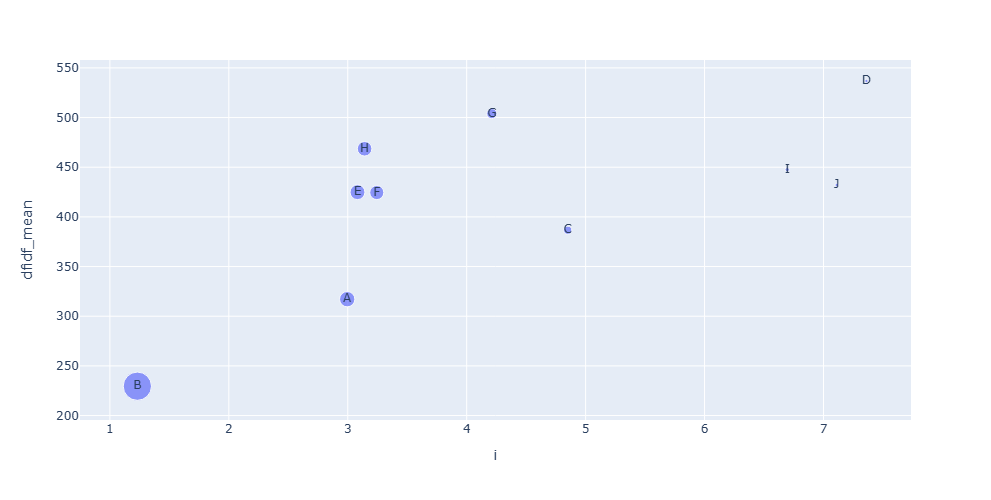

In [38]:
px.scatter(CATS.reset_index(), 'i', 'dfidf_mean', 
           hover_name='top_terms',
           text='cat', size='n', 
           height=500, width=600)